# Run & display stats

In [2]:
import gc
import os
import datetime
import numpy as np
import scipy.stats as st
import pandas as pd
import openpyxl

from tqdm.notebook import tqdm

from sim import FunctionType, DistributionType, Simulation, StaticSimulation, SimulationResults, LinearSimulation, \
                LinearRandFixSimulationStatic, LinearFixedSimulationStatic, LinearSimulationStatic, SimulationEnsemble, \
                LongstepRandFixSimulationStatic, LongstepFixedSimulationStatic

from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph, CliqueOfCliquesGraph
from rw_utils import pickle_obj
from utils import print_graph, intersect, merge_sim
from db import SimulationDatabase, SimulationDirectory

In [54]:
num_nodes = 500
#nums_edges = [460, 360, 370, 280]
graph_types = [GraphType.roc, GraphType.ringClusters, GraphType.twoLevelEr, GraphType.ringRings, GraphType.cliqueOfCliques]

# Для Равномерного и случайного распределения
graphs = {
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.024, 'probability_2': 0.001}),
    # (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.1}),
    # (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 4, 'clique_size_2': 6, "rand": False}),
}

# (GraphType): Graph
# graphs = {
#     # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
#     (GraphType.roc): (RocGraph, {'num_cliques': 10, 'clique_size': 50}),
#     (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.2}),
#     (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 50, 'probability_1': 0.2, 'probability_2': 0.02}),
#     (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.2}),
#     (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 10, 'clique_size_2': 50, "rand": False}),
# }

# (FunctionType, DistributionType, static): Simulation
simulations = {
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedOneCluster, True): LinearFixedSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
    # (FunctionType.longstep, DistributionType.randFix, True): LongstepRandFixSimulationStatic,
    # (FunctionType.longstep, DistributionType.fixedOneCluster, True): LongstepFixedSimulationStatic,
    # (FunctionType.longstep, DistributionType.fixedAllCluster, True): LongstepFixedSimulationStatic,
}



In [59]:
num_runs = 100
# params = {
#     'graph': None,
#     'count_vert': 10,
#     'isOneCluster': None,
#     'clusters_vert': None,
#     'beta_0': 0.055,
#     'beta_1': 0.0205,
#     'alpha_0': 0.0,
#     'alpha_1': 0.0,
#     'X': np.array([[.16666, 0.7], [.2, 1.0]]),
#     'max_num_iter': 500_000,
#     'is_uncomplete': False
# }
params = {
    'graph': None,
    'count_vert': 10,
    'isOneCluster': None,
    'clusters_vert': None,
    'beta_0': 0.055,
    'beta_1': 0.034,
    'alpha_0': 0.0,
    'alpha_1': 0.0,
    'X': np.array([[.16666, 0.5], [.2, 1.0]]),
    'max_num_iter': 100_000,
    'is_uncomplete': False
}
# params = {
#     'graph': None,
#     'count_vert': 10,
#     'isOneCluster': None,
#     'clusters_vert': None,
#     'beta_0': 0.055,
#     'beta_1': 0.034,
#     'alpha_0': 0.0,
#     'alpha_1': 0.0,
#     'X': np.array([[.16666, 0.5], [.2, 0.9]]),
#     'max_num_iter': 100_000,
#     'is_uncomplete': False
# }

## Run

In [60]:
for i in range(50):
    print(i + 1)
    for (graph_type), (graph_class, graph_params) in graphs.items():
        params['graph'] = graph_class(**graph_params)
        degrees = [val for (node, val) in params['graph'].graph.degree()]
        all_degrees = set(degrees)
        save = {deg:degrees.count(deg) for deg in all_degrees}
        print(save)
        print(sum(save.get(i, 0) for i in range(1,6)))
        if (params['graph'].graph_type == GraphType.roc or
            params['graph'].graph_type == GraphType.ringClusters or
            params['graph'].graph_type == GraphType.twoLevelEr or
            params['graph'].graph_type == GraphType.ringRings or 
            params['graph'].graph_type == GraphType.cliqueOfCliques):
    
            tmp = params['graph'].generate_clusters_node()
            params['clusters_vert'] = tmp
            
        for (func_type, distribution_type, static), simulation_class in simulations.items():
            if (params['graph'].graph_type == GraphType.roc or
                params['graph'].graph_type == GraphType.ringClusters or
                params['graph'].graph_type == GraphType.twoLevelEr or
                params['graph'].graph_type == GraphType.ringRings or 
                params['graph'].graph_type == GraphType.cliqueOfCliques):
                
                params['isOneCluster'] = (distribution_type == DistributionType.fixedOneCluster)
            
            sim = simulation_class(**params)
            sim_ensemble = SimulationEnsemble(sim, num_runs)
            sim_ensemble.run(f"inter_twolever_{i}")

1
(1) Create
(1) Create
{1: 4, 2: 25, 3: 43, 4: 58, 5: 76, 6: 91, 7: 75, 8: 51, 9: 30, 10: 24, 11: 12, 12: 6, 13: 1, 14: 2, 15: 1, 16: 1}
206


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1530 edges):  29%|██▉       | 29/100 [00:21<02:44,  2.31s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1530 edges):  68%|██████▊   | 68/100 [00:41<00:44,  1.40s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1530 edges): 100%|█████████| 100/100 [00:48<00:00,  2.05it/s]
LongstepFixedSimulationStatic (fixedonecluster) on twoleveler(n=500,p=0.024,q=0.001) (1530 edges): 100%|███| 100/100 [00:06<00:00, 14.45it/s]
LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1530 edges): 100%|███| 100/100 [00:09<00:00, 10.66it/s]


2
{1: 8, 2: 16, 3: 44, 4: 66, 5: 65, 6: 77, 7: 75, 8: 60, 9: 48, 10: 17, 11: 12, 12: 7, 13: 2, 14: 3}
199


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):  30%|███       | 30/100 [00:21<02:08,  1.83s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):  58%|█████▊    | 58/100 [00:47<01:57,  2.81s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):  87%|████████▋ | 87/100 [01:05<00:25,  1.93s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):  93%|█████████▎| 93/100 [01:13<00:15,  2.22s/it]

Uncompleted!!!


LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges): 100%|█████████| 100/100 [01:15<00:00,  1.32it/s]
LongstepFixedSimulationStatic (fixedonecluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges): 100%|███| 100/100 [00:14<00:00,  6.97it/s]
LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   1%|     | 1/100 [00:07<12:07,  7.35s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   2%|     | 2/100 [00:14<12:03,  7.39s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   3%|▏    | 3/100 [00:22<11:58,  7.41s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   4%|▏    | 4/100 [00:29<11:52,  7.43s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   5%|▎    | 5/100 [00:37<11:44,  7.42s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   6%|▎    | 6/100 [00:44<11:36,  7.41s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   7%|▎    | 7/100 [00:51<11:31,  7.44s/it]

Uncompleted!!!


LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001) (1557 edges):   7%|▎    | 7/100 [00:56<12:34,  8.11s/it]


KeyboardInterrupt: 

## Params for all simulations

In [3]:
num_nodes = 200
num_runs = 50

params = {
    'graph': None,
    'count_vert': None,
    'isOneCluster': None,
    'clusters_vert': None,
    'beta_0': None,
    'beta_1': None,
    'alpha_0': 0.0,
    'alpha_1': 0.0,
    'max_num_iter': 1_000_000,
    'is_uncomplete': False
}

b0s = [0.055]
b1s = [0.01, 0.05, 0.055]
# b1s = [0.055, 0.057]
count_verts = [
    [8, 20, 28, 40, 48],
    [8, 20, 28, 40, 48],
    [8, 16, 24]
]

graphs_arr = [
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 4, 'clique_size': 50}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 4, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 100, 'probability_1': 0.05, 'probability_2': 0.005}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 4, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 4, 'clique_size_2': 50, "rand": False}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 4, 'random_nodes': True, 'probability': 0.3}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 100, 'probability_1': 0.5, 'probability_2': 0.05}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 4, 'probability': 0.3}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 8, 'clique_size': 25}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 25, 'num_clusters': 8, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 25, 'num_clusters': 8, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 8, 'clique_size_2': 25, "rand": False}),
}
]

simulations_arr = [
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedOneCluster, True): LinearFixedSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
},
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedOneCluster, True): LinearFixedSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
},
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
}]

count_sim = 50
have_merge = True

## Run All Simulations

In [68]:
num_nodes = 500
num_runs = 200

params = {
    'graph': None,
    'count_vert': None,
    'isOneCluster': None,
    'clusters_vert': None,
    'beta_0': None,
    'beta_1': None,
    'alpha_0': 0.0,
    'alpha_1': 0.0,
    'max_num_iter': 1_000_000,
    'is_uncomplete': False
}

b0s = [0.055]
b1s = [0.01, 0.05, 0.055]
count_verts = [
    [10, 20, 30, 40, 50],
    [10, 20, 30, 40, 50],
    [20, 40, 60]
]

graphs_arr = [
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 10, 'clique_size': 50}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.03, 'probability_2': 0.001}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 10, 'clique_size_2': 50, "rand": False}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.3}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.3, 'probability_2': 0.01}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.3}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 20, 'clique_size': 25}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 25, 'num_clusters': 20, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 25, 'num_clusters': 20, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 20, 'clique_size_2': 25, "rand": False}),
}
]

simulations_arr = [
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedOneCluster, True): LinearFixedSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
},
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedOneCluster, True): LinearFixedSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
},
{
    (FunctionType.linear, DistributionType.randFix, True): LinearRandFixSimulationStatic,
    (FunctionType.linear, DistributionType.fixedAllCluster, True): LinearFixedSimulationStatic,
}]

count_sim = 1
have_merge = False

for cur in range(3):
    for b0 in b0s:
        params["beta_0"] = b0
        for b1 in b1s:
            params["beta_1"] = b1
            for count_vert in count_verts[cur]:
                params["count_vert"] = count_vert
                dir_path = f"{cur + 3}\\n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                for ind in range(count_sim):
                    print(ind + 1)
                    save_graph_name = {}
                    for (graph_type), (graph_class, graph_params) in graphs_arr[cur].items():
                        params['graph'] = graph_class(**graph_params)
                        save_graph_name[f"{graph_type}"] = params['graph'].name
                        
                        if (params['graph'].graph_type == GraphType.roc or
                            params['graph'].graph_type == GraphType.ringClusters or
                            params['graph'].graph_type == GraphType.twoLevelEr or
                            params['graph'].graph_type == GraphType.ringRings or 
                            params['graph'].graph_type == GraphType.cliqueOfCliques):
                            
                            params['clusters_vert'] = params['graph'].generate_clusters_node()
                            
                        for (func_type, distribution_type, static), simulation_class in simulations_arr[cur].items():
                            if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                            if (params['graph'].graph_type == GraphType.roc or
                                params['graph'].graph_type == GraphType.ringClusters or
                                params['graph'].graph_type == GraphType.twoLevelEr or
                                params['graph'].graph_type == GraphType.ringRings or 
                                params['graph'].graph_type == GraphType.cliqueOfCliques):
                                
                                params['isOneCluster'] = (distribution_type == DistributionType.fixedOneCluster)
                            
                            sim = simulation_class(**params)
                            sim_ensemble = SimulationEnsemble(sim, num_runs)
                            sim_ensemble.run(dir_path + f"\\ind_{ind}")
                if not (have_merge):
                    continue
                for (graph_type), (graph_class, graph_params) in graphs_arr[cur].items():
                    for (func_type, distribution_type, static), simulation_class in simulations_arr[cur].items():
                        if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                        merge_sim(cur_paths=["output\\" + dir_path + f"\\ind_{ind}" for ind in range(count_sim)], \
                              type_path=f"{func_type}_{distribution_type}_{save_graph_name[f"{graph_type}"]}_(count_vert={count_vert})" + "_static" * static, \
                              outpath="output\\" + dir_path)
    print(f"{cur}-----------------------------------------------------{cur}")

1


LinearRandFixSimulationStatic (randfix) on roc(k=10,l=50) (12260 edges):  98%|████████████████████████████▍| 196/200 [00:19<00:00, 10.23it/s]


KeyboardInterrupt: 

## Run All Simulations (Update)

In [13]:


for cur in range(1, 2):
    for ind in range(count_sim):
        print(ind + 1)
        save_graph_name = {}
        for (graph_type), (graph_class, graph_params) in graphs_arr[cur].items():
            params['graph'] = graph_class(**graph_params)
            save_graph_name[f"{graph_type}"] = params['graph'].name
            
            if (params['graph'].graph_type == GraphType.roc or
                params['graph'].graph_type == GraphType.ringClusters or
                params['graph'].graph_type == GraphType.twoLevelEr or
                params['graph'].graph_type == GraphType.ringRings or 
                params['graph'].graph_type == GraphType.cliqueOfCliques):
                
                params['clusters_vert'] = params['graph'].generate_clusters_node()
                
            for (func_type, distribution_type, static), simulation_class in simulations_arr[cur].items():
                for b0 in b0s:
                    params["beta_0"] = b0
                    for b1 in b1s:
                        params["beta_1"] = b1
                        for count_vert in count_verts[cur]:
                            params["count_vert"] = count_vert
                            dir_path = f"{cur + 3}\\n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                            
                            if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                            if (params['graph'].graph_type == GraphType.roc or
                                params['graph'].graph_type == GraphType.ringClusters or
                                params['graph'].graph_type == GraphType.twoLevelEr or
                                params['graph'].graph_type == GraphType.ringRings or 
                                params['graph'].graph_type == GraphType.cliqueOfCliques):
                                
                                params['isOneCluster'] = (distribution_type == DistributionType.fixedOneCluster)
                            
                            sim = simulation_class(**params)
                            sim_ensemble = SimulationEnsemble(sim, num_runs)
                            sim_ensemble.run(dir_path + f"\\ind_{ind}")
                            
    print(f"{cur}-----------------------------------------------------{cur}")

if have_merge:
    for cur in range(1, 2):
        for b0 in b0s:
            for b1 in b1s:
                for count_vert in count_verts[cur]:
                    dir_path = f"{cur + 3}\\n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                    for (graph_type), (graph_class, graph_params) in graphs_arr[cur].items():
                        for (func_type, distribution_type, static), simulation_class in simulations_arr[cur].items():
                            if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                    continue
                            merge_sim(cur_paths=["output\\" + dir_path + f"\\ind_{ind}" for ind in range(count_sim)], \
                                  type_path=f"{func_type}_{distribution_type}_{save_graph_name[f"{graph_type}"]}_(count_vert={count_vert})" + "_static" * static, \
                                  outpath="output\\" + dir_path)

10


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:00<00:00, 63.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:00<00:00, 77.89it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.17it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.61it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.42it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1661 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.54it/s]
Linear

11


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.06it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:00<00:00, 82.78it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:00<00:00, 82.22it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.02it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1686 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.08it/s]
Linear

12


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:00<00:00, 67.33it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:00<00:00, 75.48it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.18it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.51it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.80it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.31it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1664 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.87it/s]
Linear

13


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:00<00:00, 67.56it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:00<00:00, 75.60it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:00<00:00, 74.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.05it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.14it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:02<00:00, 17.13it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1687 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.25it/s]
Linear

14


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:00<00:00, 74.48it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.82it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.88it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.04it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1622 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.02it/s]
Linear

15


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 61.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 73.40it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.01it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.68it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 82.48it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:02<00:00, 17.89it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:01<00:00, 28.00it/s]
Linear

16


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.16it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.26it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:00<00:00, 82.78it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.79it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.80it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.26it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1645 edges): 100%|█████████████████| 50/50 [00:01<00:00, 26.70it/s]
Linear

17


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.42it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.76it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.96it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.97it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.01it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.09it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1667 edges): 100%|█████████████████| 50/50 [00:01<00:00, 32.07it/s]
Linear

18


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:00<00:00, 66.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:00<00:00, 75.83it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:00<00:00, 74.26it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.24it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.10it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:02<00:00, 17.75it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1704 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.78it/s]
Linear

19


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:00<00:00, 64.83it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:00<00:00, 70.37it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.75it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.61it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.99it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:02<00:00, 17.88it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1647 edges): 100%|█████████████████| 50/50 [00:01<00:00, 28.15it/s]
Linear

20


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.67it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.00it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.20it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 92.30it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.01it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:02<00:00, 18.19it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:01<00:00, 28.93it/s]
Linear

21


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:00<00:00, 72.07it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.32it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.51it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:00<00:00, 96.09it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.30it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1700 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.28it/s]
Linear

22


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 65.49it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 77.54it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.35it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.67it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.20it/s]
Linear

23


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.55it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.31it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 94.91it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.80it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.45it/s]
Linear

24


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:00<00:00, 66.61it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.95it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:00<00:00, 94.92it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.03it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1617 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.97it/s]
Linear

25


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 66.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.01it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.09it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.07it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.33it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.71it/s]
Linear

26


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.62it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.50it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.97it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.74it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.28it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1633 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.96it/s]
Linear

27


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:00<00:00, 66.31it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:00<00:00, 75.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:00<00:00, 77.78it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.11it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.67it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1603 edges): 100%|█████████████████| 50/50 [00:01<00:00, 26.84it/s]
Linear

28


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:00<00:00, 66.98it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:00<00:00, 72.44it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.88it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.00it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.40it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1650 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.13it/s]
Linear

29


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:00<00:00, 63.98it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:00<00:00, 72.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.52it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.75it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.57it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:03<00:00, 14.13it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1696 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.06it/s]
Linear

30


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.09it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.80it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.26it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.79it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.49it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.36it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1630 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.66it/s]
Linear

31


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:00<00:00, 70.04it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.17it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.85it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.71it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.13it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.02it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1666 edges): 100%|█████████████████| 50/50 [00:01<00:00, 33.00it/s]
Linear

32


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.43it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.62it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.99it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.29it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.90it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.34it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1681 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.55it/s]
Linear

33


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.20it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.86it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.35it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.23it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:00<00:00, 98.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1628 edges): 100%|█████████████████| 50/50 [00:01<00:00, 28.94it/s]
Linear

34


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 83.61it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.96it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.31it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.48it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1607 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.08it/s]
Linear

35


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:00<00:00, 64.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.46it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.06it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.84it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.65it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.64it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1634 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.41it/s]
Linear

36


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 67.52it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.72it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.03it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.55it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:03<00:00, 15.40it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1678 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.31it/s]
Linear

37


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.60it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.24it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.71it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1640 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.17it/s]
Linear

38


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:00<00:00, 70.90it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.18it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.60it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:00<00:00, 92.46it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.56it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.57it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1654 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.22it/s]
Linear

39


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.86it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.69it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.06it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:00<00:00, 87.55it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.07it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.53it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1591 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.28it/s]
Linear

40


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:00<00:00, 63.09it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:00<00:00, 74.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:00<00:00, 77.05it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.39it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.38it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:02<00:00, 18.57it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1651 edges): 100%|█████████████████| 50/50 [00:01<00:00, 27.92it/s]
Linear

41


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:00<00:00, 69.01it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:00<00:00, 78.00it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.76it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.42it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:00<00:00, 97.49it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.10it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1629 edges): 100%|█████████████████| 50/50 [00:01<00:00, 32.72it/s]
Linear

42


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.53it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.03it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.17it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.79it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.79it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:02<00:00, 21.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1716 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.39it/s]
Linear

43


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.95it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.39it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:00<00:00, 90.94it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.13it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1604 edges): 100%|█████████████████| 50/50 [00:01<00:00, 32.08it/s]
Linear

44


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 72.23it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.91it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.63it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 91.02it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 92.22it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.14it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:01<00:00, 30.05it/s]
Linear

45


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 67.83it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 75.33it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 82.50it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 86.71it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 88.48it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.22it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.87it/s]
Linear

46


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:00<00:00, 71.77it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:00<00:00, 80.78it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.17it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:00<00:00, 92.56it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:00<00:00, 91.96it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:02<00:00, 22.27it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1621 edges): 100%|█████████████████| 50/50 [00:01<00:00, 33.36it/s]
Linear

47


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.30it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.47it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.83it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.50it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:00<00:00, 91.21it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:02<00:00, 22.16it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1669 edges): 100%|█████████████████| 50/50 [00:01<00:00, 31.30it/s]
Linear

48


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 71.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.46it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 85.54it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 95.41it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:00<00:00, 96.29it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.58it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1636 edges): 100%|█████████████████| 50/50 [00:01<00:00, 33.71it/s]
Linear

49


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 70.76it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 76.12it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 84.17it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 89.91it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:00<00:00, 96.57it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:02<00:00, 20.16it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1663 edges): 100%|█████████████████| 50/50 [00:01<00:00, 29.35it/s]
Linear

50


LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:00<00:00, 68.80it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:00<00:00, 79.25it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:00<00:00, 81.90it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.14it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:00<00:00, 93.57it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:02<00:00, 19.98it/s]
LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3) (1711 edges): 100%|█████████████████| 50/50 [00:01<00:00, 28.40it/s]
Linear

1-----------------------------------------------------1


## Display stats

In [4]:
path_dir = f'output\\merge_new_new\\merge'

table_dict = {}
table_dict['Graph Type'] = []

cnt = 0
for (_, distribution_type, _), _ in simulations.items():
    table_dict[f"{distribution_type}_l"] = []
    table_dict[f"{distribution_type}_r"] = []
    table_dict[f"{distribution_type}_E[t]"] = []
    table_dict[f"{distribution_type}_t_max"] = []
    cnt += 1

for i in range(cnt):
    for j in range(i + 1, cnt):
        table_dict[f"{i + 1}-{j + 1}"] = []

df = pd.DataFrame(table_dict)

sdb = SimulationDatabase(path=path_dir)

for (graph_type), (_, graph_params) in graphs.items():
    all_int = []
    new_row = {}
    new_row["Graph Type"] = f"{graph_type}"
    for (func_type, distribution_type, static), _ in simulations.items():
        sdirs = [
            sdir
            for sdir in sdb.sdirs
            if (sdir.sim.func_type == func_type) and
            (sdir.sim.distribution_type == distribution_type) and
            (static is isinstance(sdir.sim, StaticSimulation)) and
            (sdir.sim.graph.graph_type == graph_type)
        ]
        
        if len(sdirs) != 1:
            raise RuntimeError(f"Found {len(sdirs)} SimulationDirectories after filter. Expected over 1.")

        sdir = sdirs[0]
        
        sdir.cache()
        sdir.info()
        
        tmp_times = sdir.times[sdir.outcomes]
        
        if (len(tmp_times) > 30):
            all_int.append(st.norm.interval(confidence=0.95, loc=sdir.t_mean_1, scale=sdir.sem))
        else: 
            all_int.append(st.t.interval(confidence=0.95, df=len(tmp_times)-1, loc=sdir.t_mean_1, scale=sdir.sem))
            
        print("norm interval: ", all_int[-1])
        
        new_row[f"{distribution_type}_l"], new_row[f"{distribution_type}_r"] = all_int[-1]
        new_row[f"{distribution_type}_E[t]"] = sdir.t_mean_1
        new_row[f"{distribution_type}_t_max"] = sdir.t_max
        
        del sdir
        
        gc.collect()
    
    for i in range(len(all_int)):
        for j in range(i + 1, len(all_int)):
            if intersect(all_int[i], all_int[j]):
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'='"
            elif (all_int[i][0] > all_int[j][0]):
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'>'"
            else:
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'<'"
    print(new_row)
    df.loc[len(df.index)] = new_row

df.to_excel(path_dir + '\\interval.xlsx')

SimulationDirectory for LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001), 1545 edges (50 runs)
E[t|~A] = None
E[t|A] = 30953.86
tmax = 243469
standart_error = 8273.630838479363
norm interval:  (14737.84153520052, 47169.87846479948)
SimulationDirectory for LongstepFixedSimulationStatic (fixedonecluster) on twoleveler(n=500,p=0.024,q=0.001), 1545 edges (50 runs)
E[t|~A] = None
E[t|A] = 1586.64
tmax = 4923
standart_error = 113.39954562051285
norm interval:  (1364.380974720588, 1808.8990252794122)
SimulationDirectory for LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001), 1545 edges (50 runs)
E[t|~A] = None
E[t|A] = 44916.94871794872
tmax = 500001
standart_error = 13692.124916437411
norm interval:  (18080.877009907894, 71753.02042598954)
{'Graph Type': 'twoleveler', 'randfix_l': 14737.84153520052, 'randfix_r': 47169.87846479948, 'randfix_E[t]': 30953.86, 'randfix_t_max': 243469, 'fixedonecluster_l': 1364.380974720588, 'fixedon

## Display Stats LongStepFunction

In [ ]:
path_dir = f'output\\merge_new_new\\merge'

table_dict = {}
table_dict['Graph Type'] = []

cnt = 0
for (_, distribution_type, _), _ in simulations.items():
    table_dict[f"{distribution_type}_l"] = []
    table_dict[f"{distribution_type}_r"] = []
    table_dict[f"{distribution_type}_E[t]"] = []
    table_dict[f"{distribution_type}_t_max"] = []
    cnt += 1

for i in range(cnt):
    for j in range(i + 1, cnt):
        table_dict[f"{i + 1}-{j + 1}"] = []

df = pd.DataFrame(table_dict)

sdb = SimulationDatabase(path=path_dir)

for (graph_type), (_, graph_params) in graphs.items():
    all_int = []
    new_row = {}
    new_row["Graph Type"] = f"{graph_type}"
    for (func_type, distribution_type, static), _ in simulations.items():
        sdirs = [
            sdir
            for sdir in sdb.sdirs
            if (sdir.sim.func_type == func_type) and
            (sdir.sim.distribution_type == distribution_type) and
            (static is isinstance(sdir.sim, StaticSimulation)) and
            (sdir.sim.graph.graph_type == graph_type)
        ]
        
        if len(sdirs) != 1:
            raise RuntimeError(f"Found {len(sdirs)} SimulationDirectories after filter. Expected over 1.")

        sdir = sdirs[0]
        
        sdir.cache()
        sdir.info()
        
        tmp_times = sdir.times
        mean = tmp_times.mean()
        sem = st.sem(tmp_times)
        
        if (len(tmp_times) > 30):
            all_int.append(st.norm.interval(confidence=0.95, loc=mean, scale=sem))
        else: 
            all_int.append(st.t.interval(confidence=0.95, df=len(tmp_times)-1, loc=mean, scale=sem))
            
        print("norm interval: ", all_int[-1])
        
        new_row[f"{distribution_type}_l"], new_row[f"{distribution_type}_r"] = all_int[-1]
        new_row[f"{distribution_type}_E[t]"] = sdir.t_mean_1
        new_row[f"{distribution_type}_t_max"] = sdir.t_max
        
        del sdir
        
        gc.collect()
    
    for i in range(len(all_int)):
        for j in range(i + 1, len(all_int)):
            if intersect(all_int[i], all_int[j]):
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'='"
            elif (all_int[i][0] > all_int[j][0]):
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'>'"
            else:
                new_row[f"{(i + 1)}-{(j + 1)}"] = "'<'"
    print(new_row)
    df.loc[len(df.index)] = new_row

df.to_excel(path_dir + '\\interval.xlsx')

## Display Stats All Simulations

In [4]:
graphs_arr = [
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 10, 'clique_size': 50}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.03, 'probability_2': 0.001}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 10, 'clique_size_2': 50, "rand": False}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.3}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.3, 'probability_2': 0.01}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.3}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 20, 'clique_size': 25}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 25, 'num_clusters': 20, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 25, 'num_clusters': 20, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 20, 'clique_size_2': 25, "rand": False}),
}
]

have_merge = False

table_dict_main = {}
table_dict_main["ind"] = []
table_dict_main["n"] = []
table_dict_main["st_n"] = []
table_dict_main["b0"] = []
table_dict_main["b1"] = []
table_dict_main['Graph Type'] = []
cnt = 0

for (_, distribution_type, _), _ in simulations_arr[0].items():
    table_dict_main[f"{distribution_type}_l"] = []
    table_dict_main[f"{distribution_type}_r"] = []
    table_dict_main[f"{distribution_type}_E[t]"] = []
    table_dict_main[f"{distribution_type}_t_max"] = []
    cnt += 1

for i in range(cnt):
    for j in range(i + 1, cnt):
        table_dict_main[f"{i + 1}-{j + 1}"] = []


for cur in range(1, 2):
    wb = openpyxl.Workbook()
    filepath = f"output//{cur + 3}//interval_all_sim.xlsx"
    wb.save(filepath)
    writer = pd.ExcelWriter(filepath, engine='openpyxl')

    df_main = pd.DataFrame(table_dict_main)
    
    for b0 in b0s:
        params["beta_0"] = b0
        for b1 in b1s:
            params["beta_1"] = b1
            for count_vert in count_verts[cur]:
                params["count_vert"] = count_vert
                path_dir_cur = f"output//{cur + 3}//n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                
                for ind in range(count_sim + (1 * have_merge)):
                    print(ind + 1)
                    
                    path_dir = path_dir_cur
                    
                    if (ind != count_sim):
                        path_dir += f"//ind_{ind}"
                    else:
                        path_dir += f"//merge"
                    
                    table_dict = {}
                    table_dict['Graph Type'] = []
                    
                    cnt = 0
                    for (_, distribution_type, _), _ in simulations_arr[cur].items():
                        if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                        table_dict[f"{distribution_type}_l"] = []
                        table_dict[f"{distribution_type}_r"] = []
                        table_dict[f"{distribution_type}_E[t]"] = []
                        table_dict[f"{distribution_type}_t_max"] = []
                        cnt += 1
                    
                    for i in range(cnt):
                        for j in range(i + 1, cnt):
                            table_dict[f"{i + 1}-{j + 1}"] = []
                    
                    df = pd.DataFrame(table_dict)
                    
                    sdb = SimulationDatabase(path=path_dir)
                    print(path_dir)
                    for (graph_type), (_, graph_params) in graphs_arr[cur].items():
                        all_int = []
                        new_row = {}
                        new_row["Graph Type"] = f"{graph_type}"    
                        for (func_type, distribution_type, static), _ in simulations_arr[cur].items():
                            if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                            sdirs = [
                                sdir
                                for sdir in sdb.sdirs
                                if (sdir.sim.func_type == func_type) and
                                (sdir.sim.distribution_type == distribution_type) and
                                (static is isinstance(sdir.sim, StaticSimulation)) and
                                (sdir.sim.graph.graph_type == graph_type)
                            ]
                            
                            if len(sdirs) != 1:
                                raise RuntimeError(f"Found {len(sdirs)} SimulationDirectories after filter. Expected over 1.")
                    
                            sdir = sdirs[0]
                            
                            sdir.cache()
                            sdir.info()
                            
                            tmp_times = sdir.times[sdir.outcomes]
                            if (len(tmp_times) > 30):
                                all_int.append(st.norm.interval(confidence=0.95, loc=sdir.t_mean_1, scale=sdir.sem))
                            else: 
                                all_int.append(st.t.interval(confidence=0.95, df=len(tmp_times)-1, loc=sdir.t_mean_1, scale=sdir.sem))
        
                            print("norm interval: ", all_int[-1])
                            
                            new_row[f"{distribution_type}_l"], new_row[f"{distribution_type}_r"] = all_int[-1]
                            new_row[f"{distribution_type}_E[t]"] = sdir.t_mean_1
                            new_row[f"{distribution_type}_t_max"] = sdir.t_max
                            
                            del sdir
                            
                            gc.collect()
    
                        for i in range(len(all_int)):
                            for j in range(i + 1, len(all_int)):
                                if intersect(all_int[i], all_int[j]):
                                    new_row[f"{(i + 1)}-{(j + 1)}"] = "'='"
                                elif (all_int[i][0] > all_int[j][0]):
                                    new_row[f"{(i + 1)}-{(j + 1)}"] = "'>'"
                                else:
                                    new_row[f"{(i + 1)}-{(j + 1)}"] = "'<'"
                        
                        df.loc[len(df.index)] = new_row

                        new_row["ind"] = ind
                        new_row["n"] = num_nodes
                        new_row["st_n"] = count_vert
                        new_row["b0"] = b0
                        new_row["b1"] = b1
                        
                        df_main.loc[len(df_main.index)] = new_row
                    df.to_excel(path_dir + '\\interval.xlsx', sheet_name=f"n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}")
                    
                    df.to_excel(writer, sheet_name=f"n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}", index=False)
                    
                    
    df_main.to_excel(writer, sheet_name=f"All params", index=False)
    writer.close()
    print(f"{cur}-----------------------------------------------------{cur}")

1
output//4//n=200 st_n=8 b0=0.055_b1=0.01//ind_0
SimulationDirectory for LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3), 1718 edges (50 runs)
E[t|~A] = None
E[t|A] = 208.44
tmax = 331
standart_error = 5.311686000063004
norm interval:  (198.02928674269089, 218.8507132573091)
SimulationDirectory for LinearFixedSimulationStatic (fixedonecluster) on ringclusters(n=200,m=4,p=0.3), 1718 edges (50 runs)
E[t|~A] = None
E[t|A] = 238.14
tmax = 328
standart_error = 5.163767806474617
norm interval:  (228.01920107478233, 248.26079892521764)
SimulationDirectory for LinearFixedSimulationStatic (fixedallcluster) on ringclusters(n=200,m=4,p=0.3), 1718 edges (50 runs)
E[t|~A] = None
E[t|A] = 207.1
tmax = 294
standart_error = 4.552931327559135
norm interval:  (198.17641857389995, 216.02358142610004)
SimulationDirectory for LinearRandFixSimulationStatic (randfix) on twoleveler(n=200,p=0.5,q=0.05), 5423 edges (50 runs)
E[t|~A] = None
E[t|A] = 203.98
tmax = 308
standart_error = 4.

# Plot & animate

In [4]:
import os
import gc
import numpy as np
from matplotlib import pyplot as plt

from sim import FunctionType, StaticSimulation, FixedSimulation, RandFixSimulation, FunctionType
from graph import GraphType, RocGraph
from plot import SigmaPlot
from db import SimulationDatabase, SimulationDirectory
from utils import sigma_mean, sigmas, pad
from rw_utils import read_pickled, deserialize_boolean_array
from animate import animate

%matplotlib inline

In [9]:
color = {
    GraphType.roc: 'red',
    GraphType.ringClusters: 'green',
    GraphType.twoLevelEr: 'blue',
    GraphType.ringRings: 'yellow',
}

x_right = {
    FunctionType.linear: 2500
}

label = {
    GraphType.roc: 'кольцо клик',
    GraphType.ringClusters: 'регулярное кольцо с "городами"',
    GraphType.twoLevelEr: 'двухуровневый Эрдеша-Реньи',
    GraphType.ringRings: 'Кольцо 2-регулярных колец'
}

## Plot all

twoleveler_b0=0.055_b1=0.034_p=0.024_q=0.001_count_static=10_static.png:
caching SimulationDirectory for LongstepRandFixSimulationStatic (randfix) on twoleveler(n=500,p=0.024,q=0.001), 1530 edges (100 runs)...
caching SimulationDirectory for LongstepFixedSimulationStatic (fixedonecluster) on twoleveler(n=500,p=0.024,q=0.001), 1530 edges (100 runs)...
caching SimulationDirectory for LongstepFixedSimulationStatic (fixedallcluster) on twoleveler(n=500,p=0.024,q=0.001), 1530 edges (100 runs)...



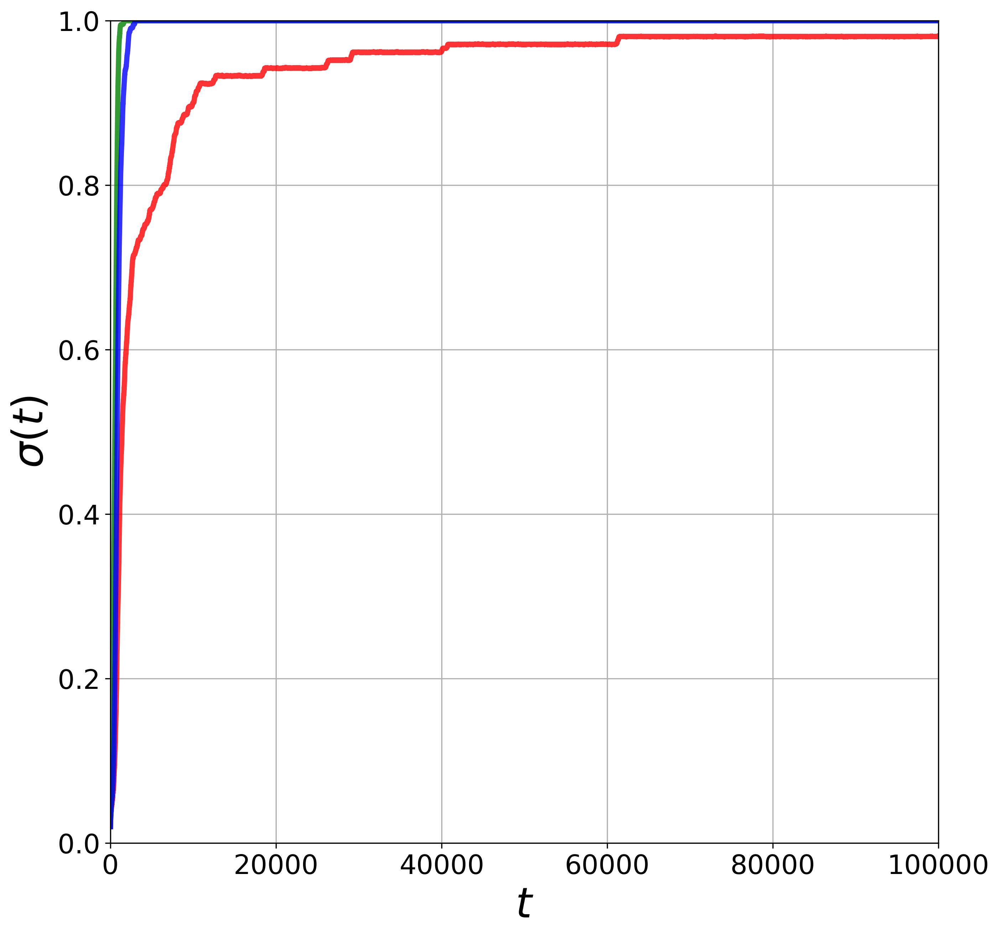

In [62]:

color_my = {
    DistributionType.randFix: 'red',
    DistributionType.fixedOneCluster: 'green',
    DistributionType.fixedAllCluster: 'blue'
}

label_my = {
    DistributionType.randFix: 'Случайно в графе',
    DistributionType.fixedOneCluster: 'в одном городе',
    DistributionType.fixedAllCluster: 'во всех городах поровну'
}

statics = [
    True
]

func_types = [
    # FunctionType.linear,
    FunctionType.longstep
]

distribution_types = [
    DistributionType.randFix,
    DistributionType.fixedOneCluster,
    DistributionType.fixedAllCluster
]

graph_types = [
    # GraphType.roc,
    # GraphType.ringClusters,
    GraphType.twoLevelEr,
    # GraphType.cliqueOfCliques,
    # GraphType.ringRings
]

x_right_static = [2500, 100000]


sdb = SimulationDatabase(path=f'output\\Интересно!!!\\inter_twolever_0')
for static in statics:
    for func_type in func_types:
        for graph_type in graph_types:
            
            sdirs = [
                sdir
                for sdir in sdb.sdirs
                if (sdir.sim.func_type == func_type) and
                (static is isinstance(sdir.sim, StaticSimulation)) and
                (sdir.sim.graph.graph_type != GraphType.complete) and
                (sdir.sim.graph.graph_type == graph_type)
            ]
            
            if len(sdirs) != 2 and len(sdirs) != 3:
                raise RuntimeError(f"Expected 2 or 3 SimulationDirectories after filter, got {len(sdirs)}.")
            sim = sdirs[0].sim
            
            fname = f"{sim.graph.graph_type}_b0={sim.beta_0}_b1={sim.beta_1}"
            
            if (sim.graph.graph_type == GraphType.twoLevelEr):
                fname += f"_p={sim.graph.probability_1}_q={sim.graph.probability_2}"
            elif (sim.graph.graph_type == GraphType.roc):
                fname += f"_n_cliq={sim.graph.num_cliques}_cliq_s={sim.graph.clique_size}"
            elif (sim.graph.graph_type == GraphType.ringClusters):
                fname += f"_clus_s={sim.graph.num_nodes_cluster}_n_clus={sim.graph.num_clusters}_p={sim.graph.probability}"
            elif (sim.graph.graph_type == GraphType.ringRings):
                fname += f"_clus_s={sim.graph.num_nodes_cluster}_n_clus={sim.graph.num_clusters}_p={sim.graph.probability}"
            elif (sim.graph.graph_type == GraphType.ringRings):
                fname += f"_cliq_s_1={sim.graph.clique_size_1}_cliq_s_2={sim.graph.clique_size_2}"

            if isinstance(sim, FixedSimulation) or isinstance(sim, RandFixSimulation):
                fname += f"_count_static={sim.count_vert}"
            fname += "_static" * static + ".png"
            
            print(f"{fname}:")
            splot = SigmaPlot(linewidth=3.5, alpha=.8, ax_tick_size=18, ax_label_size=28)
            
            gc.collect()
            
            for sdir in sdirs:
                print(f'caching {sdir}...')
                sdir.cache()
            print()
            x_max = max([sdir.t_max for sdir in sdirs])
            
            for sdir in sdirs:
                splot.plot(sdir, color=color_my[sdir.sim.distribution_type], x_max=x_max, label=label_my[sdir.sim.distribution_type])
            
            for xright in x_right_static:
                splot.update_axlims(x_right=xright)
    
                # save
                splot.fig.savefig(
                    os.path.join('plots', f"({xright})" + fname),
                    bbox_inches='tight',
                    pad_inches=0
                )
                # display
                # display(splot.fig)

## Plot all for simulations

ringclusters_b0=0.055_b1=0.01_clus_s=50_n_clus=4_p=0.3_count_static=8_static.png:
caching SimulationDirectory for LinearFixedSimulationStatic (fixedallcluster) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...
caching SimulationDirectory for LinearFixedSimulationStatic (fixedonecluster) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...
caching SimulationDirectory for LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...

twoleveler_b0=0.055_b1=0.01_p=0.5_q=0.05_count_static=8_static.png:
caching SimulationDirectory for LinearFixedSimulationStatic (fixedallcluster) on twoleveler(n=200,p=0.5,q=0.05), 5525 edges (2500 runs)...
caching SimulationDirectory for LinearFixedSimulationStatic (fixedonecluster) on twoleveler(n=200,p=0.5,q=0.05), 5525 edges (2500 runs)...
caching SimulationDirectory for LinearRandFixSimulationStatic (randfix) on twoleveler(n=200,p=0.5,q=0.05), 5525 edges (2500 runs)...

ringrings_b0=0.055_b1=0.01_cl

F:\VKR\Gevo\plot.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self.fig, self.ax = plt.subplots(figsize=self._figsize, dpi=self._dpi)


caching SimulationDirectory for LinearFixedSimulationStatic (fixedallcluster) on ringrings(n=200,m=4,p=0.3), 1616 edges (2500 runs)...
caching SimulationDirectory for LinearFixedSimulationStatic (fixedonecluster) on ringrings(n=200,m=4,p=0.3), 1616 edges (2500 runs)...
caching SimulationDirectory for LinearRandFixSimulationStatic (randfix) on ringrings(n=200,m=4,p=0.3), 1616 edges (2500 runs)...

ringclusters_b0=0.055_b1=0.05_clus_s=50_n_clus=4_p=0.3_count_static=28_static.png:
caching SimulationDirectory for LinearFixedSimulationStatic (fixedallcluster) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...
caching SimulationDirectory for LinearFixedSimulationStatic (fixedonecluster) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...
caching SimulationDirectory for LinearRandFixSimulationStatic (randfix) on ringclusters(n=200,m=4,p=0.3), 1711 edges (2500 runs)...

twoleveler_b0=0.055_b1=0.05_p=0.5_q=0.05_count_static=28_static.png:
caching SimulationDirectory for LinearF

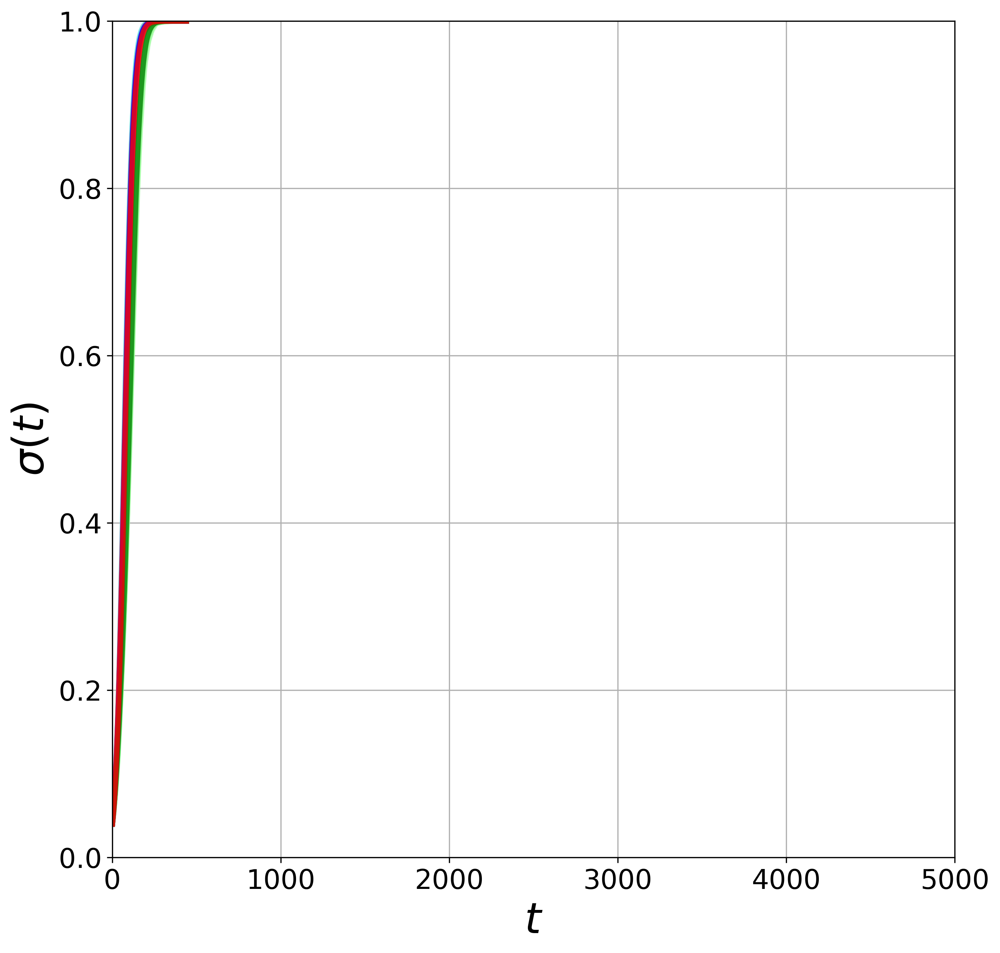

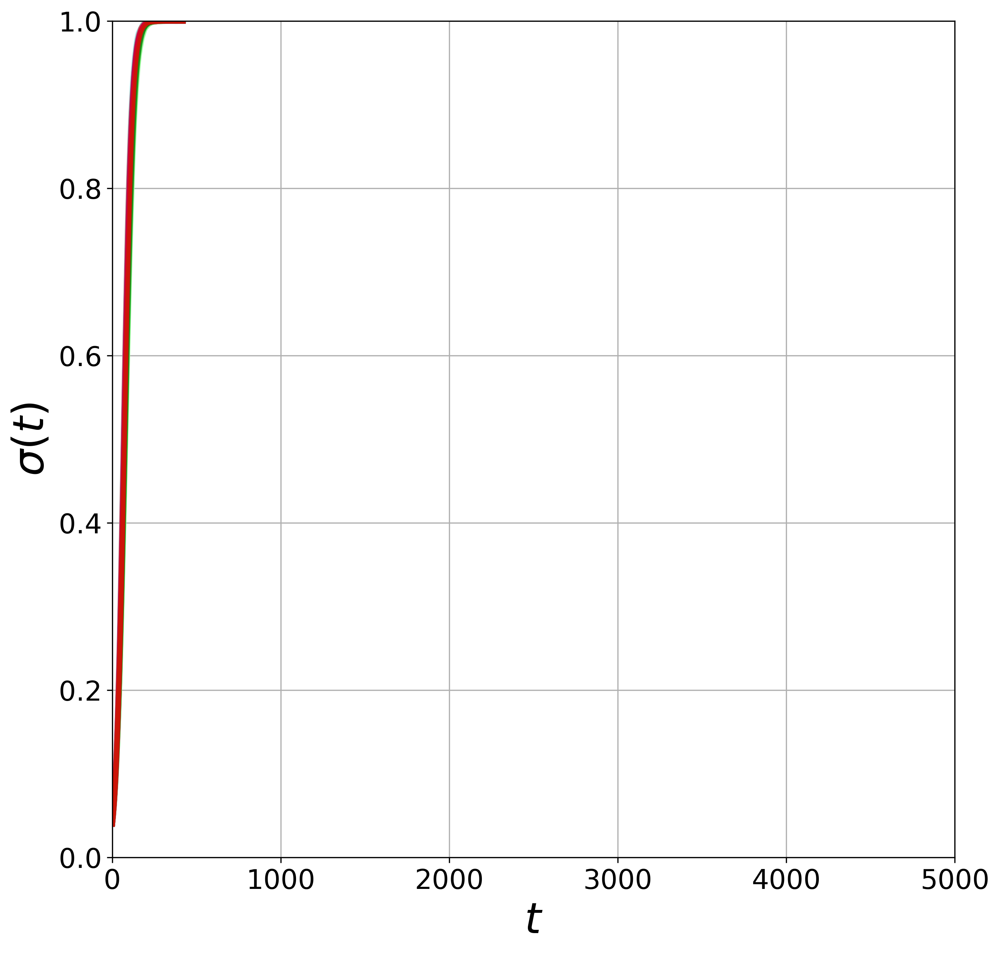

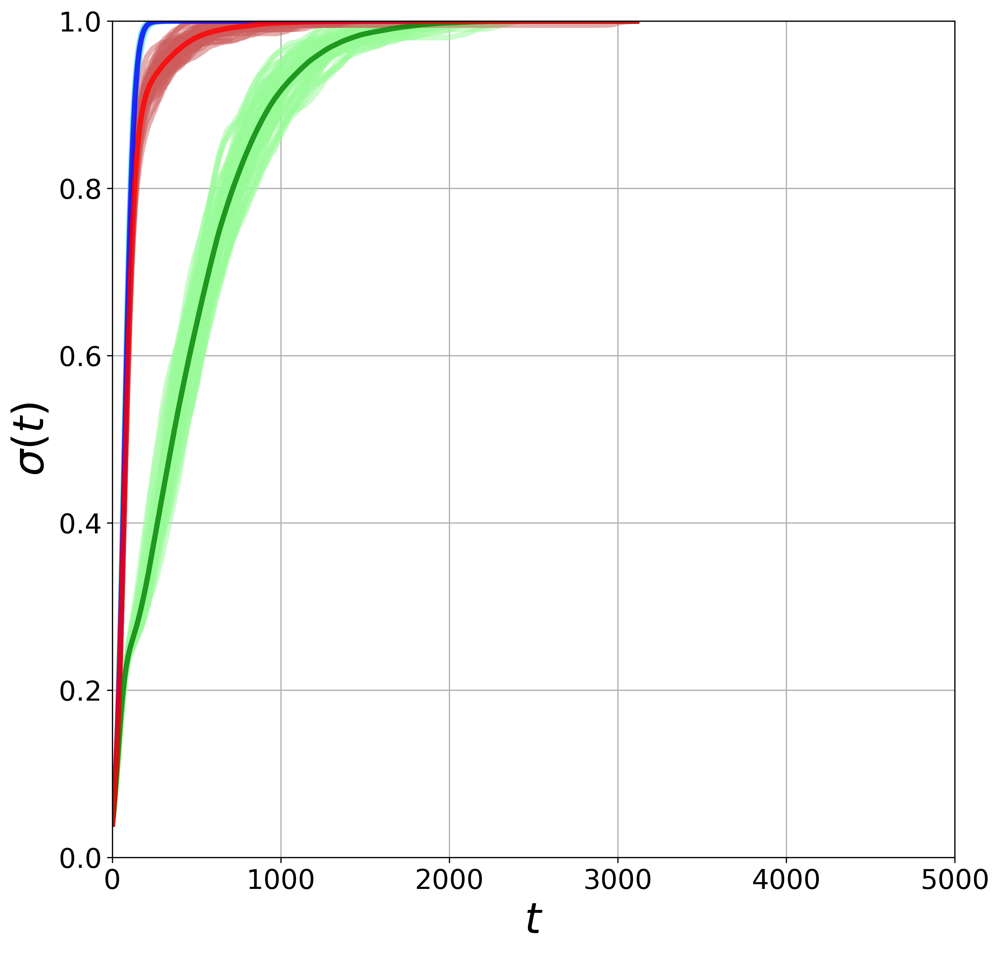

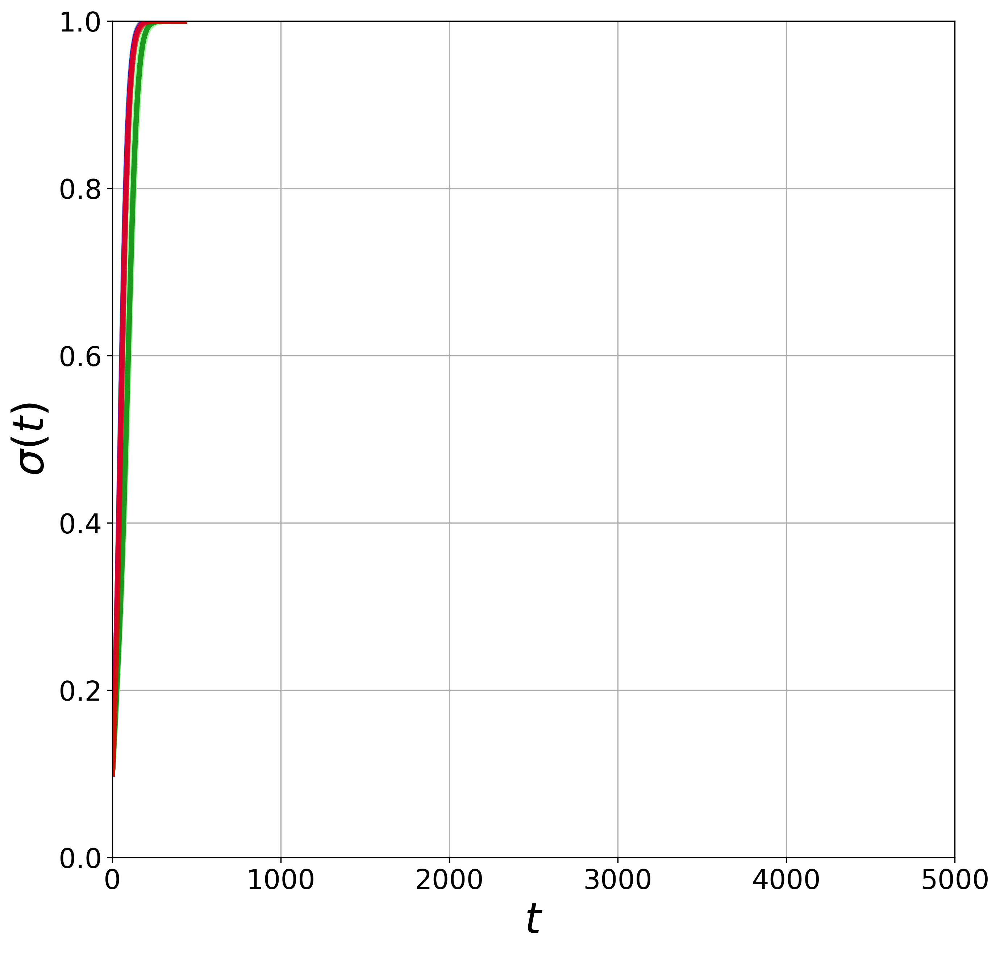

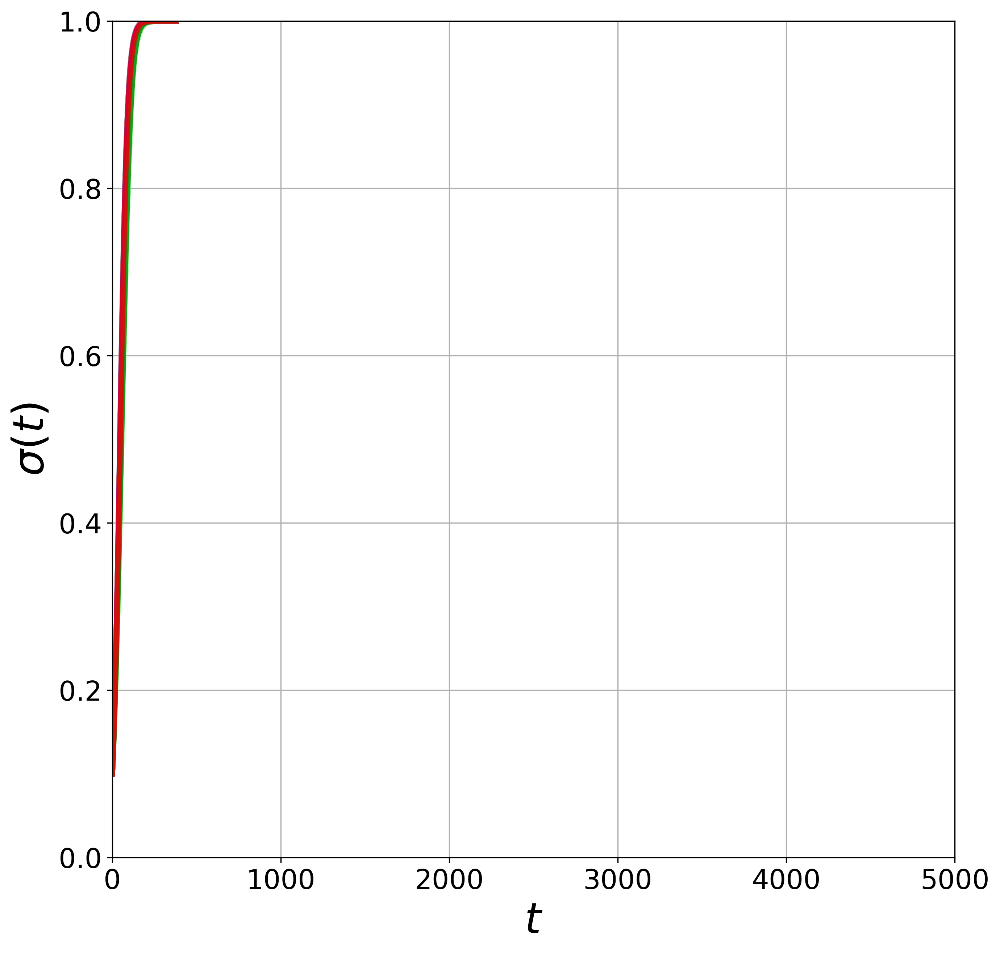

...

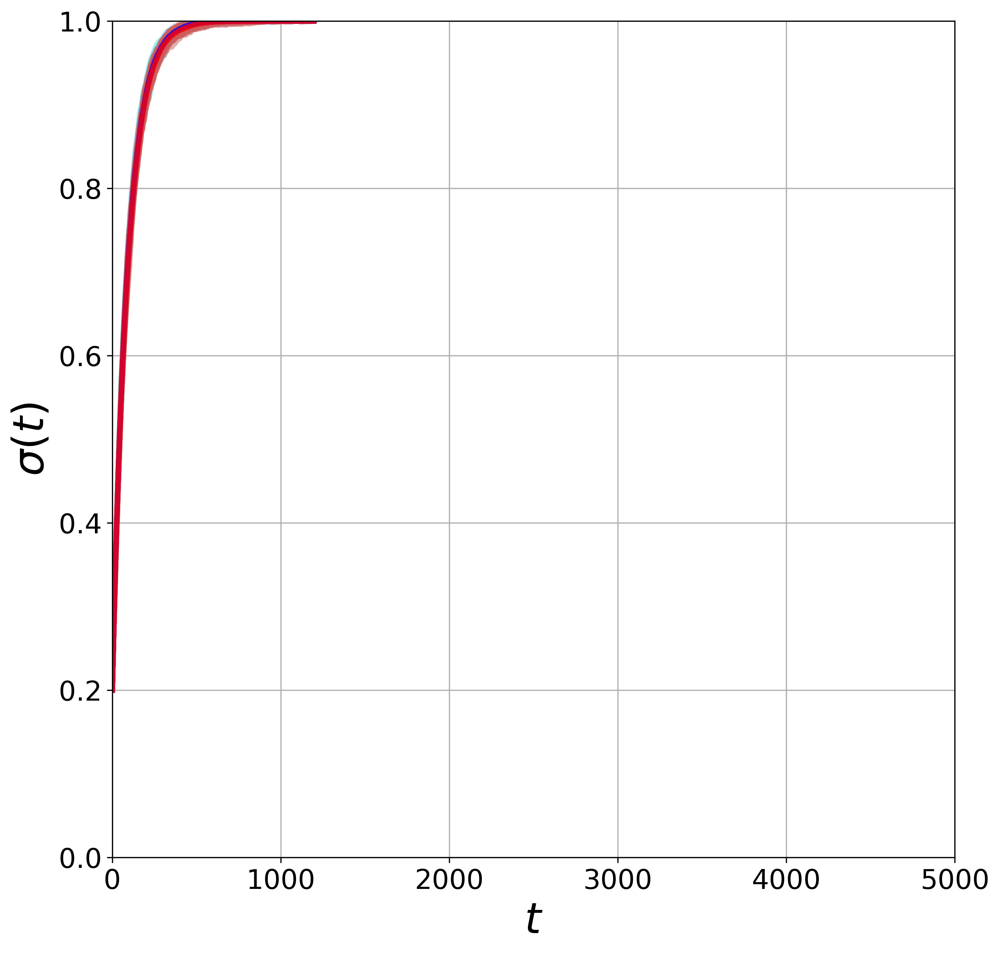

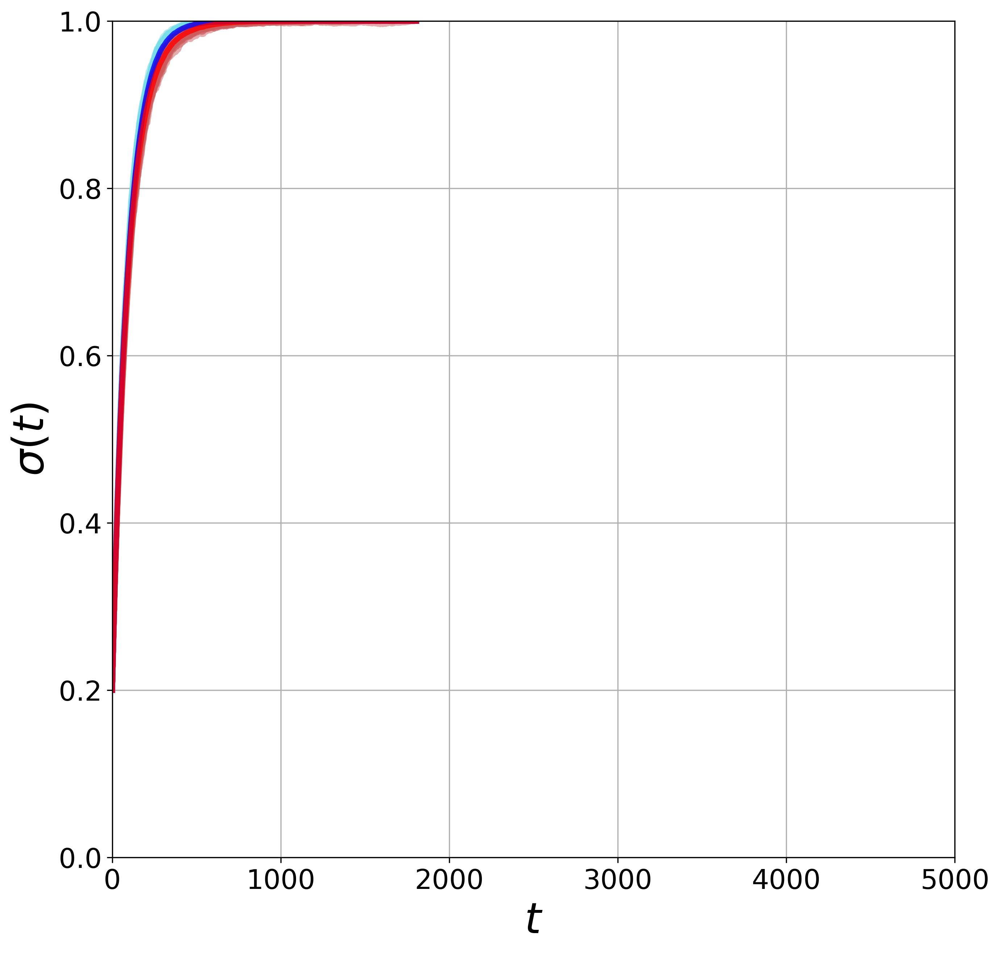

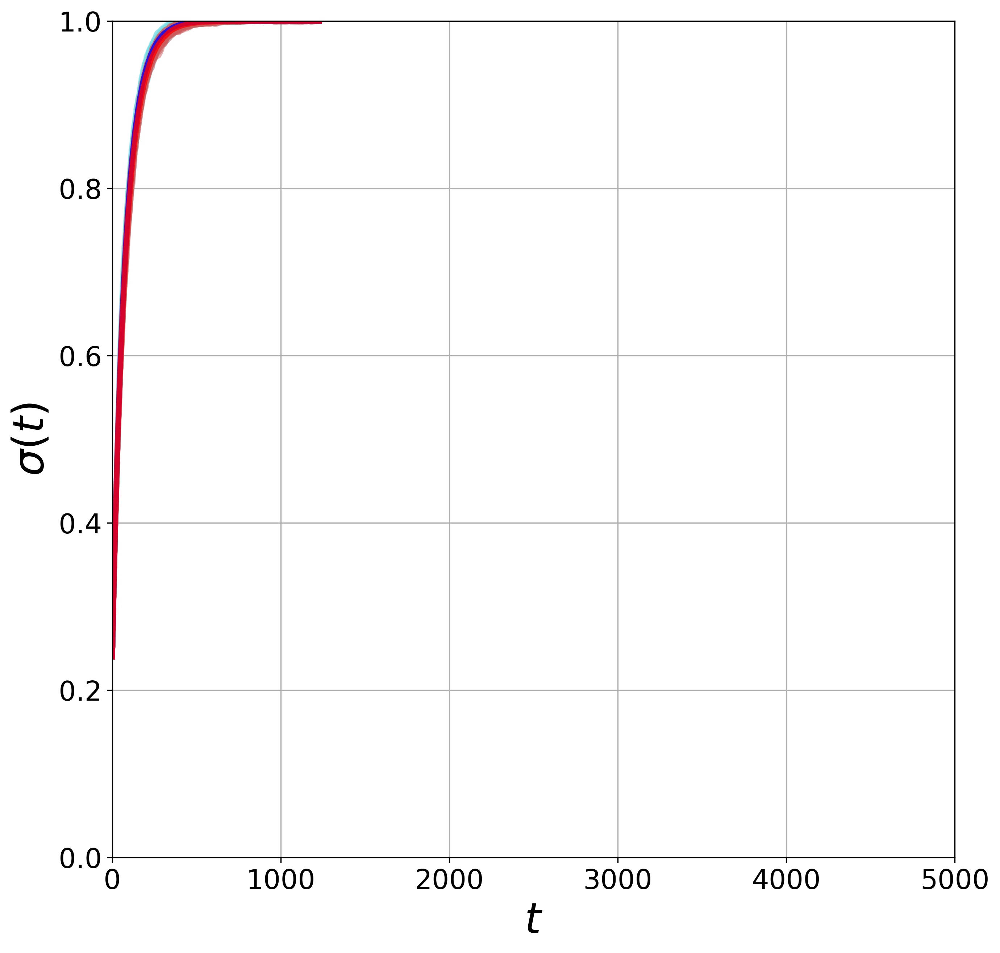

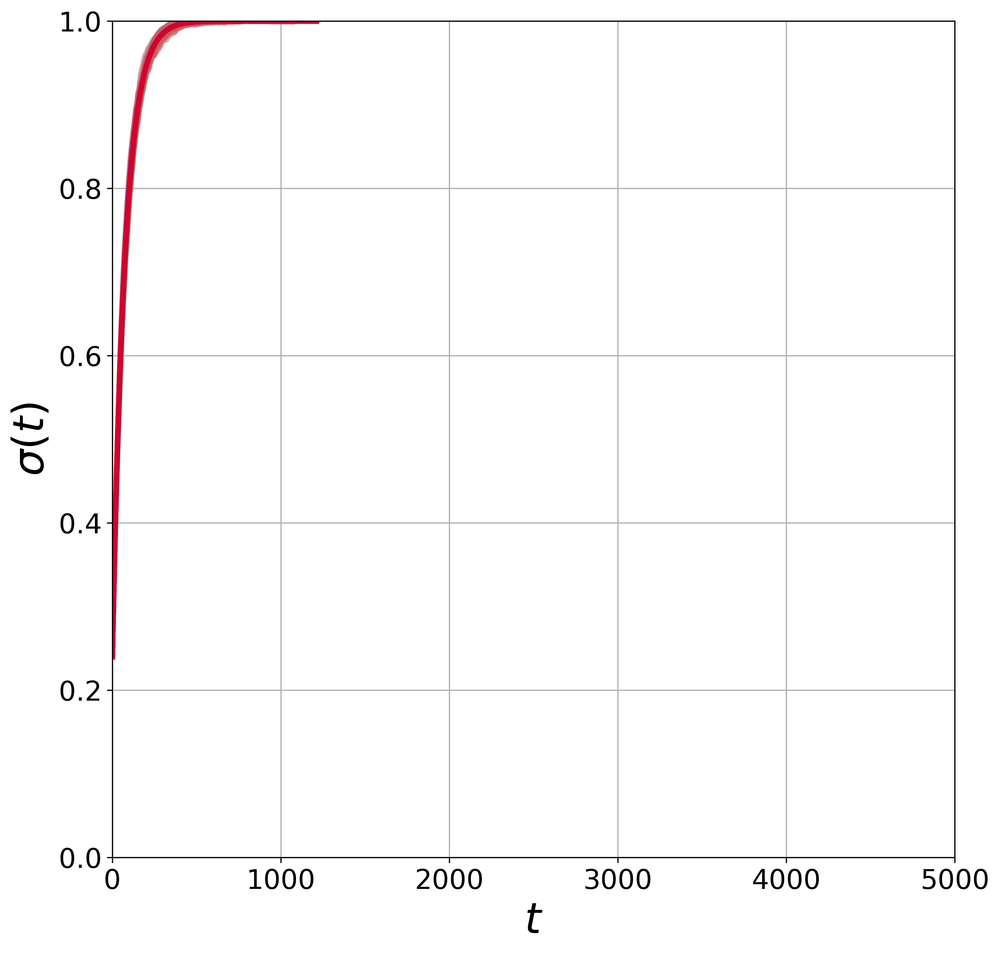

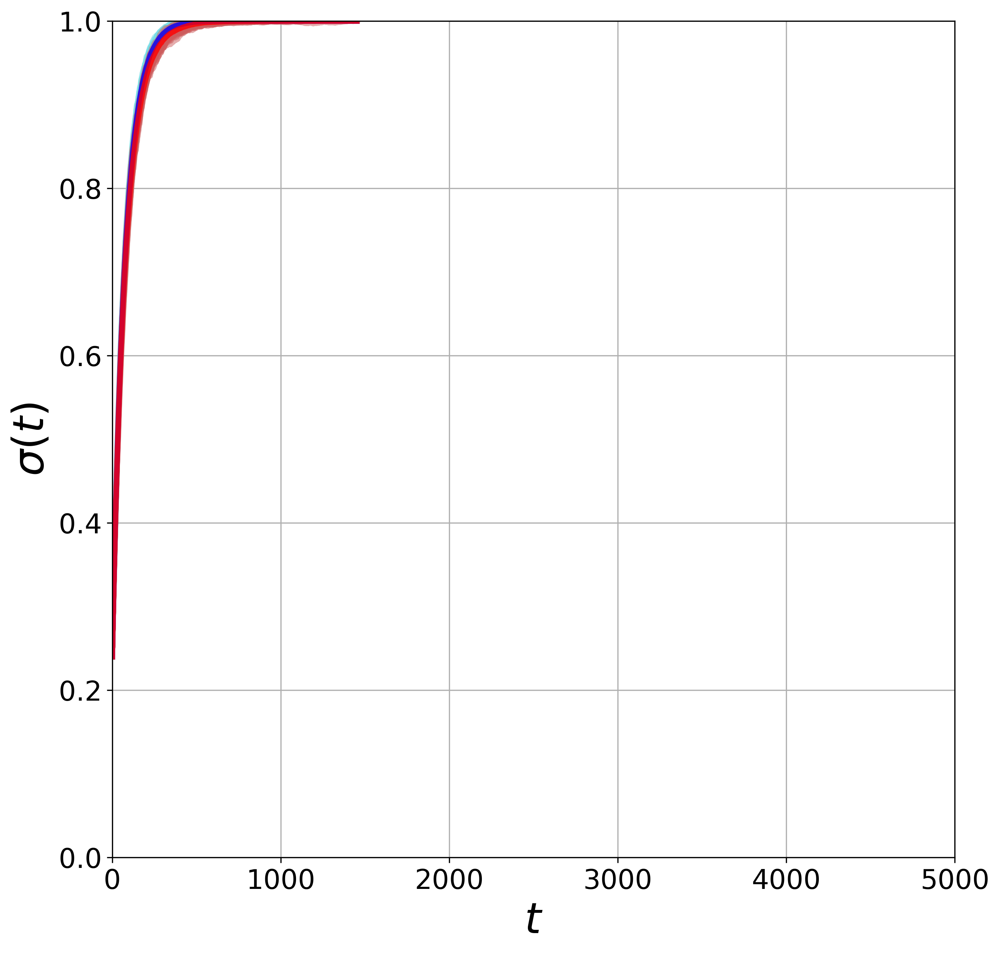

In [5]:
b0s = [0.055]

b1s = [0.01, 0.05, 0.055]

count_verts = [
    [8, 20, 28, 40, 48],
    [8, 20, 28, 40, 48],
    [8, 16, 24]
]

num_runs = 50

color_my = {
    DistributionType.randFix: 'red',
    DistributionType.fixedOneCluster: 'green',
    DistributionType.fixedAllCluster: 'blue'
}

color_sim = {
    DistributionType.randFix: '#CD5C5C',
    DistributionType.fixedOneCluster: '#98FB98',
    DistributionType.fixedAllCluster: '#77DDE7'
}

label_my = {
    DistributionType.randFix: 'Случайно в графе',
    DistributionType.fixedOneCluster: 'в одном городе',
    DistributionType.fixedAllCluster: 'во всех городах поровну'
}

statics = [
    True
]

func_types = [
    FunctionType.linear
]

x_right = {
    FunctionType.linear: 2500
}


graph_types_arr = [
[
    GraphType.roc,
    GraphType.ringClusters,
    GraphType.twoLevelEr,
    GraphType.cliqueOfCliques,
    GraphType.ringRings
],
[
    GraphType.ringClusters,
    GraphType.twoLevelEr,
    GraphType.ringRings
],
[
    GraphType.roc,
    GraphType.ringClusters,
    GraphType.cliqueOfCliques,
    GraphType.ringRings
]
]

x_right_static = [800, 5000]

for cur in range(1, 2):
    for b0 in b0s:
        for b1 in b1s:
            for count_vert in count_verts[cur]:
                for ind in range(count_sim, count_sim + (1 * have_merge)):
                    path = f"{cur + 3}//n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                    
                    if (ind != count_sim):
                        path_dir = path + f"//ind_{ind}"
                    else:
                        path_dir = path + f"//merge"
                    

                    sdb = SimulationDatabase(path='output//' + path_dir)
                    for static in statics:
                        for func_type in func_types:
                            for graph_type in graph_types_arr[cur]:
                                
                                sdirs = [
                                    sdir
                                    for sdir in sdb.sdirs
                                    if (sdir.sim.func_type == func_type) and
                                    (static is isinstance(sdir.sim, StaticSimulation)) and
                                    (sdir.sim.graph.graph_type != GraphType.complete) and
                                    (sdir.sim.graph.graph_type == graph_type)
                                ]
                                
                                if len(sdirs) != 2 and len(sdirs) != 3:
                                    raise RuntimeError(f"Expected 2 or 3 SimulationDirectories after filter, got {len(sdirs)}.")
                                sim = sdirs[0].sim
                                
                                fname = f"{sim.graph.graph_type}_b0={sim.beta_0}_b1={sim.beta_1}"
                                
                                if (sim.graph.graph_type == GraphType.twoLevelEr):
                                    fname += f"_p={sim.graph.probability_1}_q={sim.graph.probability_2}"
                                elif (sim.graph.graph_type == GraphType.roc):
                                    fname += f"_n_cliq={sim.graph.num_cliques}_cliq_s={sim.graph.clique_size}"
                                elif (sim.graph.graph_type == GraphType.ringClusters):
                                    fname += f"_clus_s={sim.graph.num_nodes_cluster}_n_clus={sim.graph.num_clusters}_p={sim.graph.probability}"
                                elif (sim.graph.graph_type == GraphType.ringRings):
                                    fname += f"_clus_s={sim.graph.num_nodes_cluster}_n_clus={sim.graph.num_clusters}_p={sim.graph.probability}"
                                elif (sim.graph.graph_type == GraphType.ringRings):
                                    fname += f"_cliq_s_1={sim.graph.clique_size_1}_cliq_s_2={sim.graph.clique_size_2}"
                    
                                if isinstance(sim, FixedSimulation) or isinstance(sim, RandFixSimulation):
                                    fname += f"_count_static={sim.count_vert}"
                                fname += "_static" * static + ".png"
                                
                                print(f"{fname}:")
                                splot = SigmaPlot(linewidth=3.5, alpha=.8, ax_tick_size=18, ax_label_size=28)
                                
                                gc.collect()
                                
                                for sdir in sdirs:
                                    print(f'caching {sdir}...')
                                    sdir.cache()
                                print()
                                x_max = max([sdir.t_max for sdir in sdirs])

                                for sdir in sdirs:
                                    sdir.cache()
                                    
                                    tmp = [sdir.state_histories[50 * j: 50 * (j + 1)] for j in range(50)]
                                    
                                    for state in tmp:
                                        sigma_avg = sigma_mean(state, pad_to=x_max)
                                        
                                        splot.ax.plot(
                                            range(len(sigma_avg)),
                                            sigma_avg,
                                            color=color_sim[sdir.sim.distribution_type],
                                            alpha=0.5,
                                            linewidth=splot.linewidth,
                                            ls=splot.linestyle,
                                            label=label_my[sdir.sim.distribution_type]
                                        )
                                
                                for sdir in sdirs:
                                    splot.plot(sdir, color=color_my[sdir.sim.distribution_type], x_max=x_max, label=label_my[sdir.sim.distribution_type])

                                if not os.path.isdir('plots\\' + path_dir + "new\\"):
                                    os.makedirs('plots\\' + path_dir + "new\\", exist_ok=True)
                                    
                                for x_right in x_right_static:  
                                    splot.update_axlims(x_right=x_right)
                                        
                                    # save
                                    splot.fig.savefig(
                                        os.path.join('plots\\' + path_dir + "new\\", f"({x_right})" + fname),
                                        bbox_inches='tight',
                                        pad_inches=0
                                    )

## Plot hist

4//n=200 st_n=8 b0=0.055_b1=0.01
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=20 b0=0.055_b1=0.01
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=28 b0=0.055_b1=0.01
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


C:\Users\Admin\AppData\Local\Temp\ipykernel_19356\2928566092.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 1, sharey=True, tight_layout=True)


4//n=200 st_n=40 b0=0.055_b1=0.01
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=48 b0=0.055_b1=0.01
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=8 b0=0.055_b1=0.05
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=20 b0=0.055_b1=0.05
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=28 b0=0.055_b1=0.05
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
4//n=200 st_n=40 b0=0.055_b1=0.05
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34

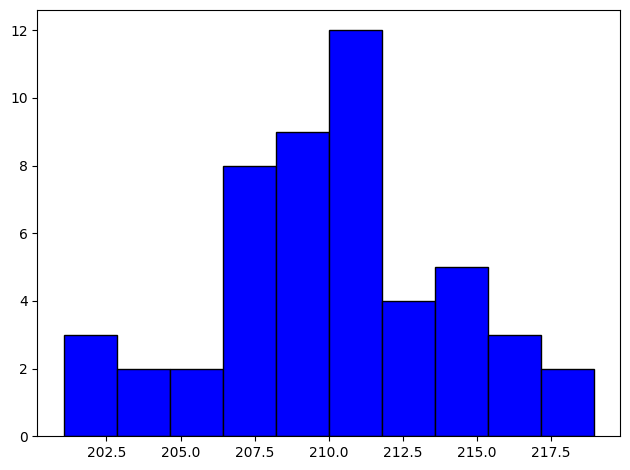

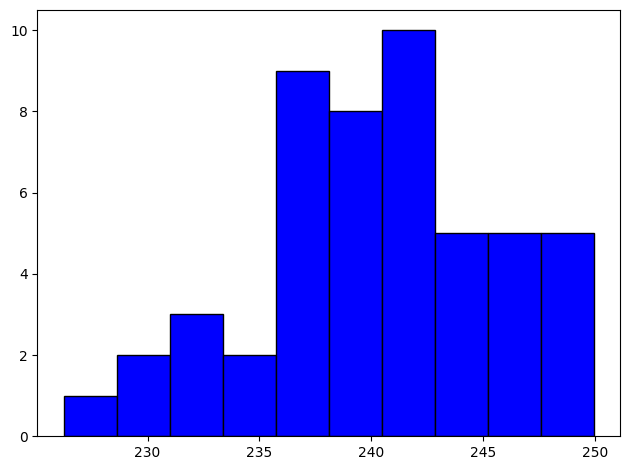

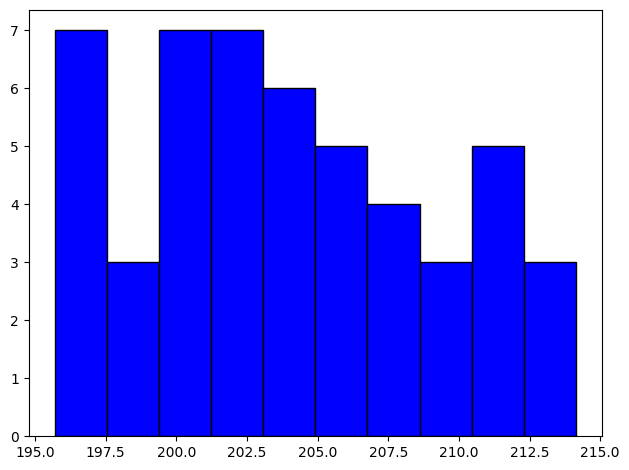

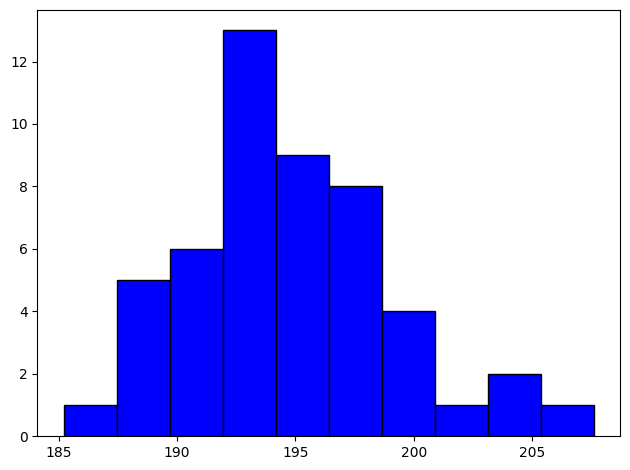

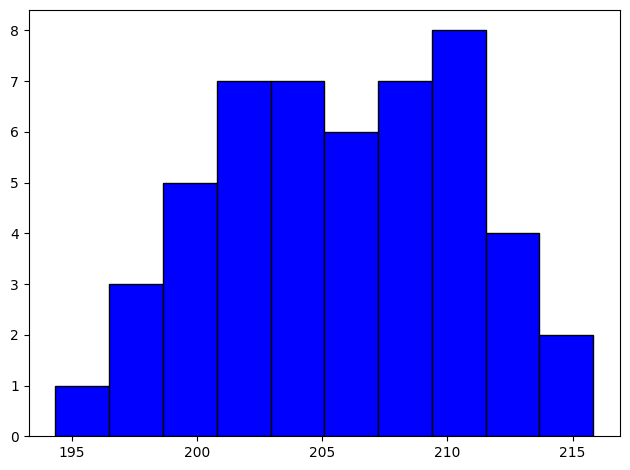

...

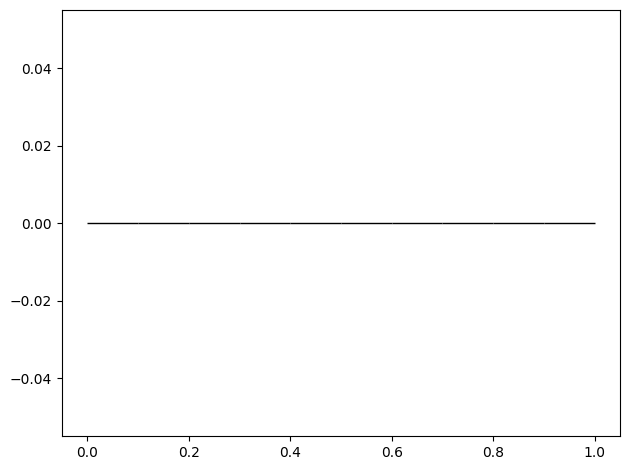

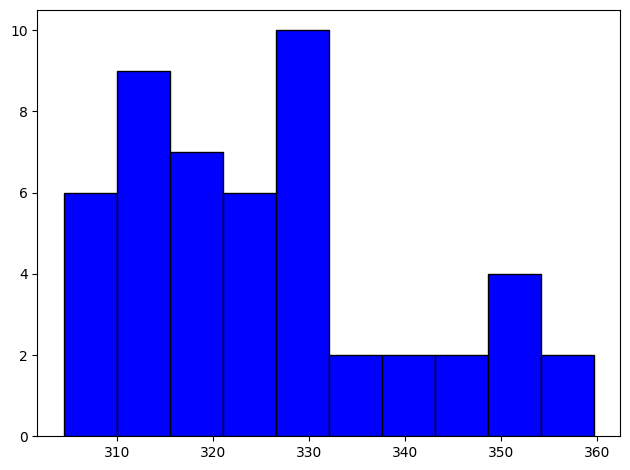

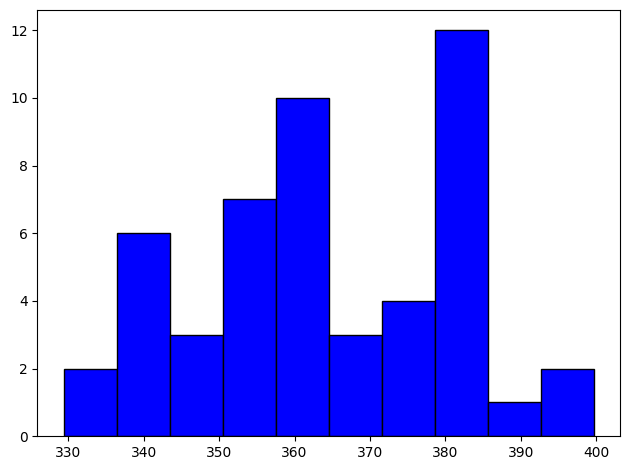

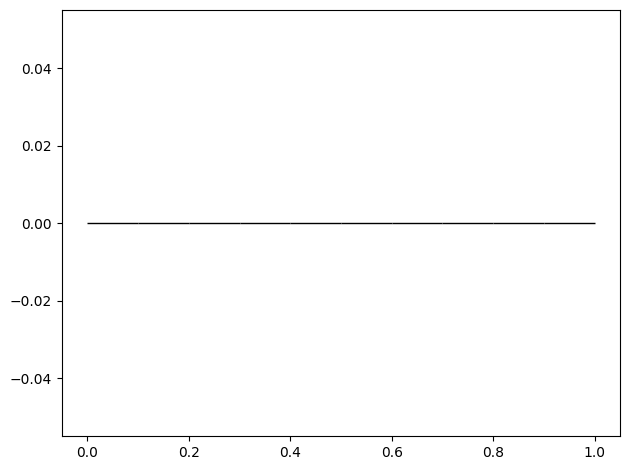

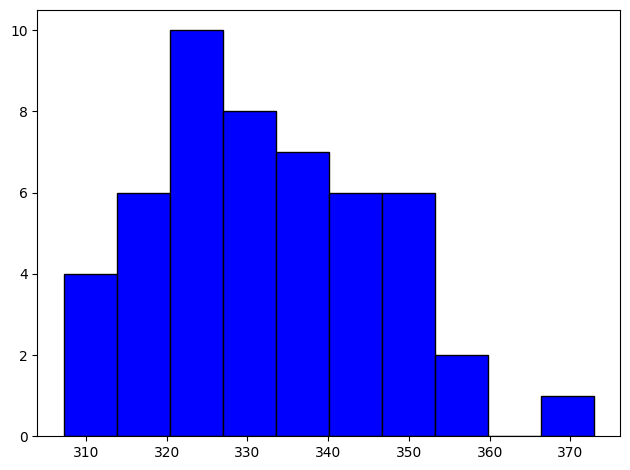

In [14]:
graphs_arr = [
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 10, 'clique_size': 50}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.03, 'probability_2': 0.001}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 10, 'clique_size_2': 50, "rand": False}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 50, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.3}),
    (GraphType.twoLevelEr): (TwoLevelErGraph, {'num_nodes_cluster': 250, 'probability_1': 0.3, 'probability_2': 0.01}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 50, 'num_clusters': 10, 'probability': 0.3}),
},
{
    # (GraphType.complete): (CompleteGraph, {'num_nodes': num_nodes}),
    (GraphType.roc): (RocGraph, {'num_cliques': 20, 'clique_size': 25}),
    (GraphType.ringClusters): (RingGraphClusters, {'num_nodes_cluster': 25, 'num_clusters': 20, 'random_nodes': True, 'probability': 0.1}),
    (GraphType.ringRings): (RingRingsGraph, {'num_nodes_cluster': 25, 'num_clusters': 20, 'probability': 0.1}),
    (GraphType.cliqueOfCliques): (CliqueOfCliquesGraph, {'clique_size_1': 20, 'clique_size_2': 25, "rand": False}),
}
]

b0s = [0.055]
b1s = [0.01, 0.05, 0.055]
# b1s = [0.055, 0.057]
count_verts = [
    [8, 20, 28, 40, 48],
    [8, 20, 28, 40, 48],
    [8, 16, 24]
]

for cur in range(1, 2):
    
    
    for b0 in b0s:   
        for b1 in b1s: 
            for count_vert in count_verts[cur]:
                
                path_dir_cur = f"{cur + 3}//n={num_nodes} st_n={count_vert} b0={b0}_b1={b1}"
                print(path_dir_cur)
                g = {}
                for (graph_type), (_, graph_params) in graphs_arr[cur].items():    
                    for (func_type, distribution_type, static), _ in simulations_arr[cur].items():
                        g[(func_type, distribution_type, graph_type, static)] = []
                
                for ind in range(count_sim):
                    print(ind + 1)
                    
                    path_dir = "output//" + path_dir_cur
                    
                    path_dir += f"//ind_{ind}"

                    
                    sdb = SimulationDatabase(path=path_dir)
                    
                    for (graph_type), (_, graph_params) in graphs_arr[cur].items():    
                        for (func_type, distribution_type, static), _ in simulations_arr[cur].items():
                            
                            if (b1 >= 0.055 and distribution_type == DistributionType.fixedOneCluster):
                                continue
                            
                            sdirs = [
                                sdir
                                for sdir in sdb.sdirs
                                if (sdir.sim.func_type == func_type) and
                                (sdir.sim.distribution_type == distribution_type) and
                                (static is isinstance(sdir.sim, StaticSimulation)) and
                                (sdir.sim.graph.graph_type == graph_type)
                            ]
                            
                            if len(sdirs) != 1:
                                raise RuntimeError(f"Found {len(sdirs)} SimulationDirectories after filter. Expected over 1.")
                            
                            sdir = sdirs[0]
                            
                            sdir.cache()
                            # sdir.info()
                            
                            g[(sdir.sim.func_type, sdir.sim.distribution_type, sdir.sim.graph.graph_type, static)].append(sdir.t_mean_1)
                            
                            del sdir
                            
                            gc.collect()
                
                for (graph_type), (_, graph_params) in graphs_arr[cur].items():    
                    for (func_type, distribution_type, static), _ in simulations_arr[cur].items():
                        fname = f"{distribution_type}_{graph_type}_b0={b0}_b1={b1}"
                                
                        if (graph_type == GraphType.twoLevelEr):
                            fname += f"_p={graph_params["probability_1"]}_q={graph_params["probability_2"]}"
                        elif (graph_type == GraphType.roc):
                            fname += f"_n_cliq={graph_params["num_cliques"]}_cliq_s={graph_params["clique_size"]}"
                        elif (graph_type == GraphType.ringClusters):
                            fname += f"_clus_s={graph_params["num_nodes_cluster"]}_n_clus={graph_params["num_clusters"]}_p={graph_params["probability"]}"
                        elif (graph_type == GraphType.ringRings):
                            fname += f"_clus_s={graph_params["num_nodes_cluster"]}_n_clus={graph_params["num_clusters"]}_p={graph_params["probability"]}"
                        elif (graph_type == GraphType.ringRings):
                            fname += f"_cliq_s_1={graph_params["clique_size_1"]}_cliq_s_2={graph_params["clique_size_2"]}"
            
                        fname += f"_count_static={count_vert}"
                        
                        fname += "_static" * static + ".png"
                        
                        fig, axs = plt.subplots(1, 1, sharey=True, tight_layout=True)
                        axs.hist(g[(func_type, distribution_type, graph_type, static)], color = 'blue', edgecolor = 'black', bins = count_sim // 5)
                        if not os.path.isdir('plots\\hists\\' + path_dir_cur):
                            os.makedirs('plots\\hists\\' + path_dir_cur, exist_ok=True)
                            
                        fig.savefig(os.path.join('plots\\hists\\' + path_dir_cur, fname),
                                    bbox_inches='tight',
                                    pad_inches=0)
                        
    print(f"{cur}-----------------------------------------------------{cur}")

## Display

In [ ]:
display(splot.fig)

## Save

In [32]:
splot.fig.savefig(
    os.path.join('plots', fname),
    bbox_inches='tight',
    pad_inches=0
)

## Animate

In [125]:
sdir = SimulationDirectory("output\\2024.05.12_01.31.38_longstep_fixedonecluster_ringclusters(n=500,m=10,p=0.1)_(count_vert=10)_static")
sr = read_pickled('7', path=sdir.path)
animate(
    sdir.sim,
    sr,
    filename='test0',
    path=sdir.path,
    t_start=max(0, 0),
    t_end=sr.t,
    overwrite=True
)
print(sr.t)

Converting fig2img: 100%|████████████████████████████████████████████████████████████████████████████████| 3637/3637 [02:14<00:00, 27.10it/s]


3637


## Test Graphs

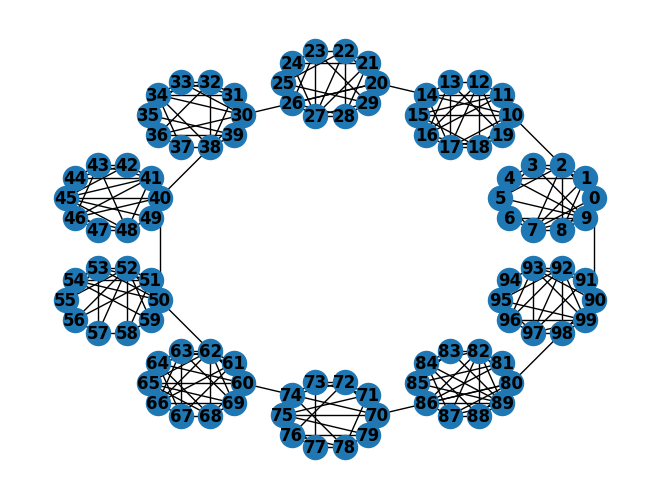

In [48]:
import networkx as nx
from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph

g = RingRingsGraph(10, 10, 0.5)

nx.draw(g.graph, g.layout, with_labels=True, font_weight='bold')


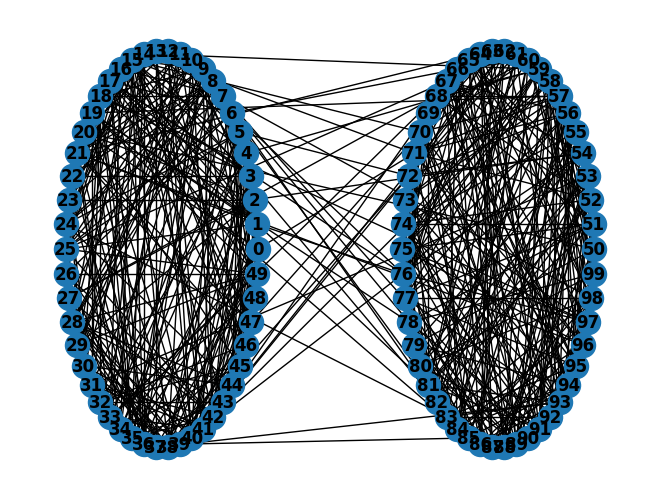

In [22]:
import networkx as nx
from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph
#     (GraphType.roc, 460): (RocGraph, {'num_cliques': 10, 'clique_size': 10}),
#     (GraphType.ringClusters, 360): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.6}),
#     #(GraphType.ringClusters, 150): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'num_edges_cluster': 5}),
#     (GraphType.twoLevelEr, 370): (TwoLevelErGraph, {'num_nodes_cluster': 50, 'probability_1': 0.1, 'probability_2': 0.05}),
#     (GraphType.ringRings,  280): (RingRingsGraph, {'num_nodes_cluster': 10, 'num_clusters': 10, 'probability': 0.5}),

g = TwoLevelErGraph(50, 0.2, 0.02)

nx.draw(g.graph, g.layout, with_labels=True, font_weight='bold')

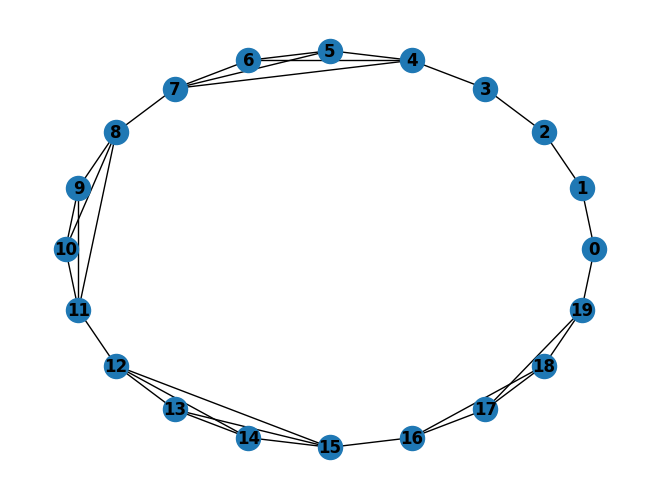

In [4]:
import networkx as nx
from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph

# (GraphType.roc, 460): (RocGraph, {'num_cliques': 10, 'clique_size': 10}),
#     (GraphType.ringClusters, 360): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.6}),
#     #(GraphType.ringClusters, 150): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'num_edges_cluster': 5}),
#     (GraphType.twoLevelEr, 370): (TwoLevelErGraph, {'num_nodes_cluster': 50, 'probability_1': 0.1, 'probability_2': 0.05}),
#     (GraphType.ringRings,  280): (RingRingsGraph, {'num_nodes_cluster': 10, 'num_clusters': 10, 'probability': 0.5}),

g = RingGraphClusters(num_nodes_cluster=4, num_clusters=5, random_nodes=False, probability=0.6)

nx.draw(g.graph, g.layout, with_labels=True, font_weight='bold')

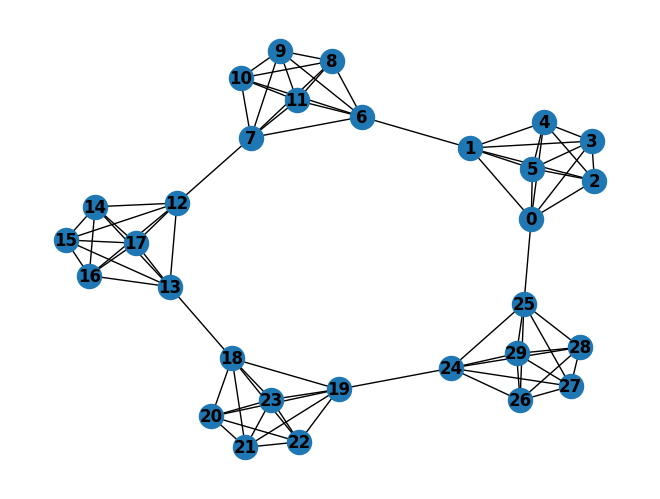

In [10]:
import networkx as nx
from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph, CliqueOfCliquesGraph

# (GraphType.roc, 460): (RocGraph, {'num_cliques': 10, 'clique_size': 10}),
#     (GraphType.ringClusters, 360): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.6}),
#     #(GraphType.ringClusters, 150): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'num_edges_cluster': 5}),
#     (GraphType.twoLevelEr, 370): (TwoLevelErGraph, {'num_nodes_cluster': 50, 'probability_1': 0.1, 'probability_2': 0.05}),
#     (GraphType.ringRings,  280): (RingRingsGraph, {'num_nodes_cluster': 10, 'num_clusters': 10, 'probability': 0.5}),

g = RocGraph(num_cliques=5, clique_size=6)

nx.draw(g.graph, g.layout, with_labels=True, font_weight='bold')

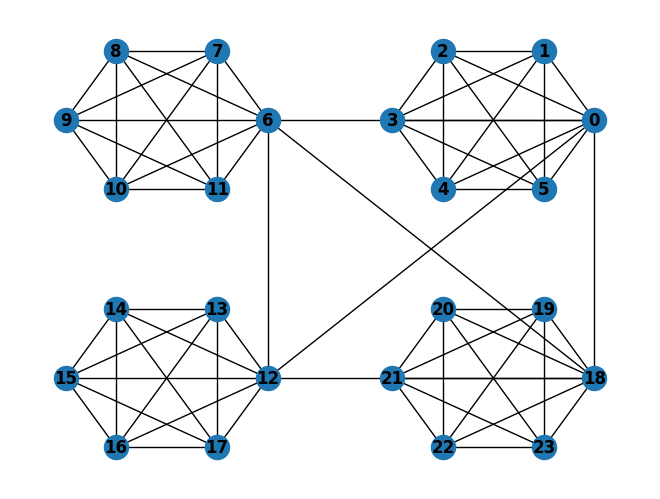

In [12]:
import networkx as nx
from graph import GraphType, RocGraph, RingGraphClusters, TwoLevelErGraph, RingRingsGraph, CliqueOfCliquesGraph

# (GraphType.roc, 460): (RocGraph, {'num_cliques': 10, 'clique_size': 10}),
#     (GraphType.ringClusters, 360): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'probability': 0.6}),
#     #(GraphType.ringClusters, 150): (RingGraphClusters, {'num_nodes_cluster': 10, 'num_clusters': 10, 'random_nodes': True, 'num_edges_cluster': 5}),
#     (GraphType.twoLevelEr, 370): (TwoLevelErGraph, {'num_nodes_cluster': 50, 'probability_1': 0.1, 'probability_2': 0.05}),
#     (GraphType.ringRings,  280): (RingRingsGraph, {'num_nodes_cluster': 10, 'num_clusters': 10, 'probability': 0.5}),

g = CliqueOfCliquesGraph(clique_size_1=4, clique_size_2=6, rand=False)

nx.draw(g.graph, g.layout, with_labels=True, font_weight='bold')

In [139]:
from utils import merge_sim

merge_sim(["output"], "longstep_randfix_twoleveler(n=500,p=0.024,q=0.001)_(count_vert=10)_static"        , "output//merge_new_new")
merge_sim(["output"], "longstep_fixedonecluster_twoleveler(n=500,p=0.024,q=0.001)_(count_vert=10)_static", "output//merge_new_new")
merge_sim(["output"], "longstep_fixedallcluster_twoleveler(n=500,p=0.024,q=0.001)_(count_vert=10)_static", "output//merge_new_new")
merge_sim(["output"], "longstep_randfix_ringclusters(n=500,m=10,p=0.1)_(count_vert=10)_static"          , "output//merge_new_new")
merge_sim(["output"], "longstep_fixedonecluster_ringclusters(n=500,m=10,p=0.1)_(count_vert=10)_static"  , "output//merge_new_new")
merge_sim(["output"], "longstep_fixedallcluster_ringclusters(n=500,m=10,p=0.1)_(count_vert=10)_static"  , "output//merge_new_new")